In [ ]:
# Cell 1: Create links to the datasets
# Cell 2: Import the data feature target CSV and divide into train and test datasets
# Cell 3: Import the image datasets, dividing into training and test based on indices from the previous step
# Cell 4: Visualise the data, 5 from each set
# Cell 5: Visualise images with bounding boxes, using data from feature target csv
# Cell 6: Import yolov8m model
# Cell 7: Train the model using the training dataset
# Cell 8: Save the model produced
# Cell 9: Carry out a prediction using the test datasets
# Cell 10: Save the result to a CSV dataset for predictions
# Cell 11: Prepare an IoU for the result

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.6/780.6 kB 10.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-

In [ ]:
!pip install gdown

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import os
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import numpy as np
from ultralytics import YOLO
import shutil
import torch
import gdown

In [ ]:
config_file_path= r"https://drive.google.com/file/d/1osuKeaTgzM3pUac-i5lf6gKHC93SVqyS/view?usp=sharing"
feature_target_csv_path = r"https://drive.google.com/file/d/1oipgZ3rhNa9o8G5AcpMjXgzAhS--ghwb/view?usp=drive_link"
# Google Drive file ID from the shareable link
file_id = '1oipgZ3rhNa9o8G5AcpMjXgzAhS--ghwb'


# Destination path to save the file
output = 'feature_target.csv'

# Construct the file URL
url = f'https://drive.google.com/uc?id={file_id}'

# Download the file
gdown.download(url, output, quiet=False)

# Load the CSV into a DataFrame
df = pd.read_csv(output, engine='python', sep=',')

Downloading...
From: https://drive.google.com/uc?id=1oipgZ3rhNa9o8G5AcpMjXgzAhS--ghwb
To: /content/feature_target.csv
100%|██████████| 74.2k/74.2k [00:00<00:00, 62.5MB/s]


In [ ]:
# Split the dataset into train and test sets
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)


In [ ]:
train_df.head()

,Image_ID,x,y,w,h
170,CC029777,0.400825,0.599537,0.240668,0.282118
270,4661E536,0.473524,0.275174,0.175998,0.326389
890,81B7CD6B,0.462500,0.241667,0.520750,0.464333
209,9EC9DEC9,0.339844,0.478009,0.335938,0.357928
721,9C527060,0.483507,0.431713,0.289714,0.344039


In [ ]:
test_df.head()

,Image_ID,x,y,w,h
889,C3E2D0F0,0.170000,0.199333,0.721250,0.730333
467,66FBB2FF,0.398220,0.474537,0.177300,0.190394
887,8D4A9B52,0.345616,0.359453,0.307836,0.615050
175,F2E4929A,0.437934,0.493924,0.390191,0.433738
1286,CFAD2322,0.480194,0.380282,0.241197,0.252347


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
dataset_512_path = '/content/drive/MyDrive/Group 18 Project/Data/IMAGES_512'
dataset_1024_path = '/content/drive/MyDrive/Group 18 Project/Data/IMAGES_1024'

def load_images_from_folder(folder, image_ids):
    images = []
    for img_id in image_ids:
        img_name = os.path.join(folder, f'{img_id}.JPG')  # Assuming image names are in the 'Image_ID' column
        try:
            img = Image.open(img_name)
            images.append(img)
        except FileNotFoundError:
            print(f"File not found: {img_name}. Skipping.")
    return images

# Extract 'Image_ID' column values
train_image_ids = train_df['Image_ID'].tolist()
test_image_ids = test_df['Image_ID'].tolist()

train_images_512 = load_images_from_folder(dataset_512_path, train_image_ids)
test_images_512 = load_images_from_folder(dataset_512_path, test_image_ids)

train_images_1024 = load_images_from_folder(dataset_1024_path, train_image_ids)
test_images_1024 = load_images_from_folder(dataset_1024_path, test_image_ids)

File not found: /content/drive/MyDrive/Group 18 Project/Data/IMAGES_512/1.06E+13.JPG. Skipping.
File not found: /content/drive/MyDrive/Group 18 Project/Data/IMAGES_512/7.98E+83.JPG. Skipping.
File not found: /content/drive/MyDrive/Group 18 Project/Data/IMAGES_512/1.86E+19.JPG. Skipping.
File not found: /content/drive/MyDrive/Group 18 Project/Data/IMAGES_512/9.15E+98.JPG. Skipping.


Displaying images from IMAGES_512 folder:


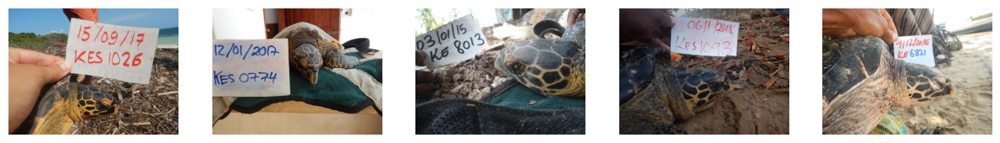

Displaying images from IMAGES_1024 folder:


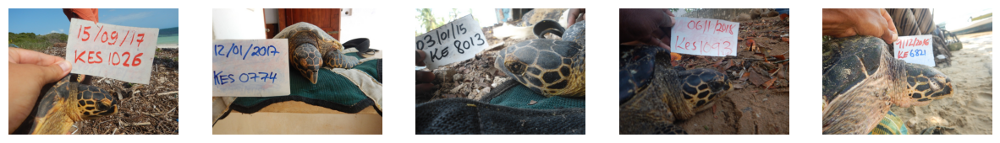

In [ ]:
def display_images(images, num_images=5):
    # Display the images
    plt.figure(figsize=(15, 5))
    for i, img in enumerate(images[:num_images]):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.axis('off')
    plt.show()

# Load and display images from both directories
print("Displaying images from IMAGES_512 folder:")
display_images(train_images_512, num_images=5)

print("Displaying images from IMAGES_1024 folder:")
display_images(train_images_1024, num_images=5)

In [ ]:
# Debug: print lengths of the image lists
print(f"Number of train images (512): {len(train_images_512)}")
print(f"Number of test images (512): {len(test_images_512)}")
print(f"Number of train images (1024): {len(train_images_1024)}")
print(f"Number of test images (1024): {len(test_images_1024)}")

Number of train images (512): 1051
Number of test images (512): 266
Number of train images (1024): 1051
Number of test images (1024): 266


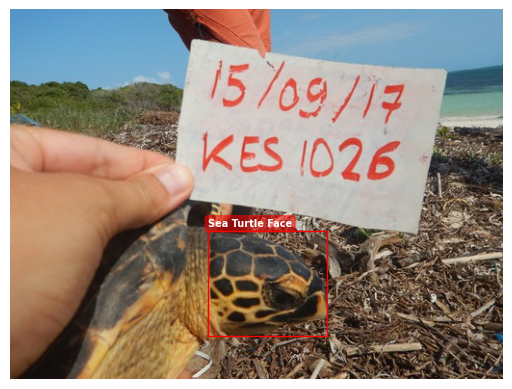

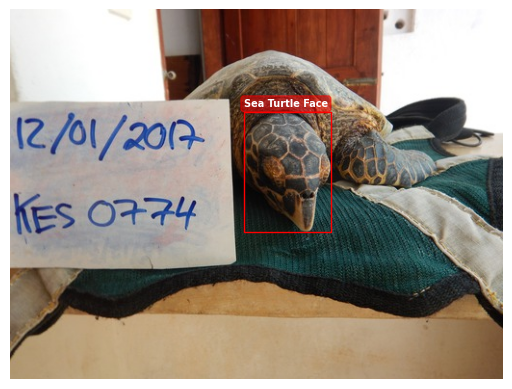

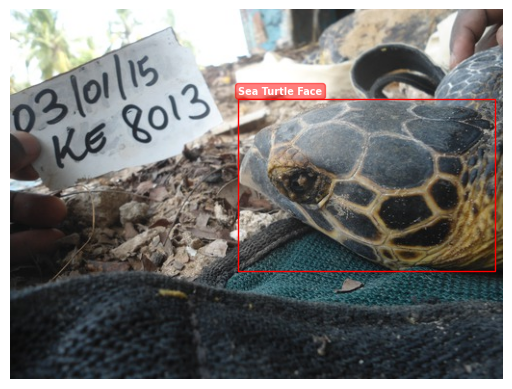

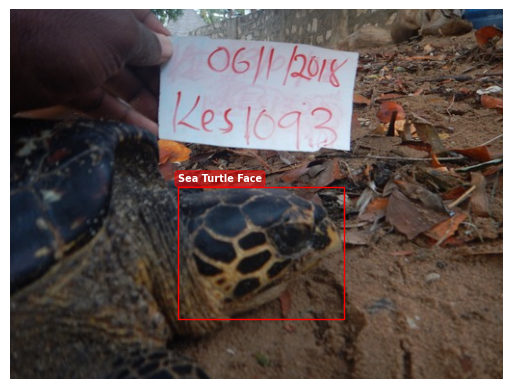

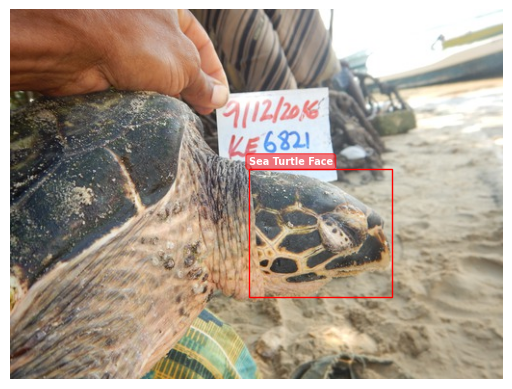

...

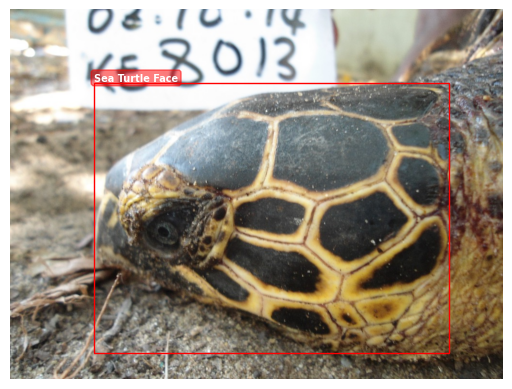

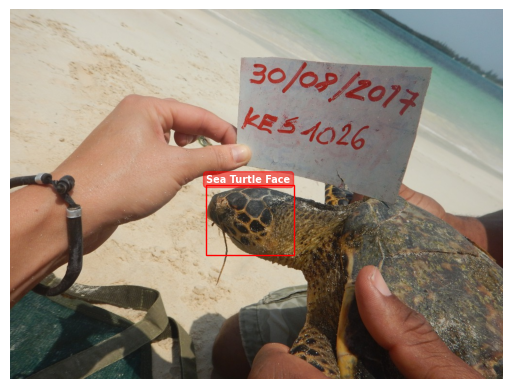

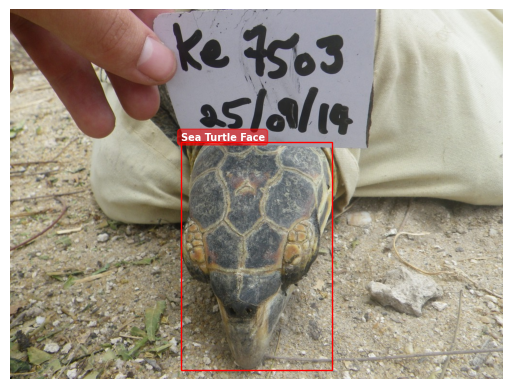

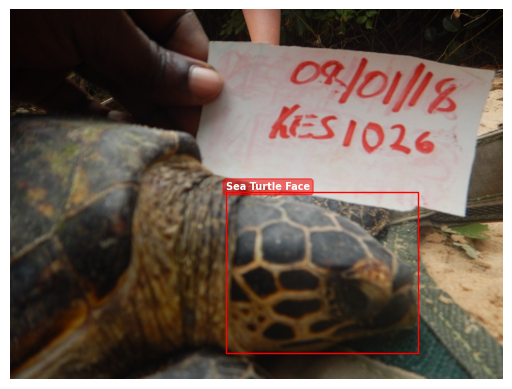

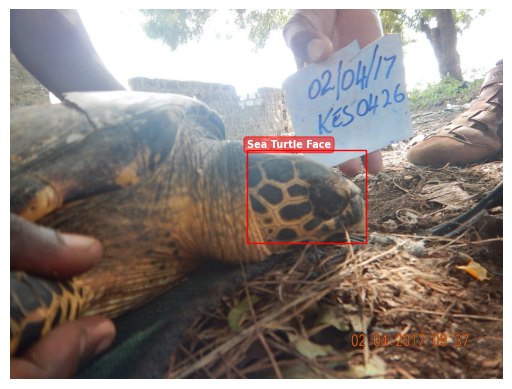

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_bounding_boxes(images, df, img_size, num_images=5):
    """
    Visualize bounding boxes on a subset of images.

    Args:
    images: List of PIL Image objects.
    df: DataFrame containing bounding box annotations.
    img_size: Tuple of image dimensions (width, height).
    num_images: Number of images to display.
    """
    for i in range(min(num_images, len(images))):
        img = images[i]
        image_id = df.iloc[i]['Image_ID']
        img_width, img_height = img_size

        # Create figure and axes
        fig, ax = plt.subplots(1)

        # Display the image
        ax.imshow(img)

        # Add bounding boxes
        annotations = df[df['Image_ID'] == image_id]
        for _, row in annotations.iterrows():
            # Convert normalized coordinates to pixel values
            x = row['x'] * img_width
            y = row['y'] * img_height
            w = row['w'] * img_width
            h = row['h'] * img_height

            rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

            # Add label
            plt.text(x, y - 5, 'Sea Turtle Face', color='white', fontsize=7, weight='bold',
                     bbox=dict(facecolor='red', alpha=0.5, edgecolor='red', boxstyle='round,pad=0.3'))

        # Show plot
        plt.axis('off')
        plt.show()

# Image sizes
img_size_512 = (512, 384)
img_size_1024 = (1024, 768)

# Example usage: Visualize bounding boxes for the first few images in the train set
visualize_bounding_boxes(train_images_512[:5], train_df, img_size_512, num_images=5)
visualize_bounding_boxes(test_images_512[:5], test_df, img_size_512, num_images=5)

visualize_bounding_boxes(train_images_1024[:5], train_df, img_size_1024, num_images=5)
visualize_bounding_boxes(test_images_1024[:5], test_df, img_size_1024, num_images=5)

In [ ]:
if os.path.exists('yolov8m.pt'):
    os.remove('yolov8m.pt')
    print("File removed successfully.")

from ultralytics import YOLO

# Initialize YOLOv8 model
basemodel = YOLO('yolov8m.pt')

100%|██████████| 49.7M/49.7M [00:00<00:00, 220MB/s]


In [ ]:
def predict_bounding_boxes(model, images):
    predictions = []
    for image in images:
        results = model(image)
        for result in results:
            # Move tensors to CPU before conversion
            boxes = result.boxes.xywh.cpu().numpy()  # Move to CPU and then convert to numpy
            scores = result.boxes.conf.cpu().numpy()  # Move to CPU and then convert to numpy
            for box, score in zip(boxes, scores):
                predictions.append({
                    'x_center': box[0],
                    'y_center': box[1],
                    'width': box[2],
                    'height': box[3],
                    'confidence': score
                })
    return pd.DataFrame(predictions)

# Predict bounding boxes on test images
test_predictions_512 = predict_bounding_boxes(basemodel, test_images_512)
test_predictions_1024 = predict_bounding_boxes(basemodel, test_images_1024)


0: 480x640 (no detections), 28.4ms
Speed: 4.5ms preprocess, 28.4ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 persons, 1 dog, 28.3ms
Speed: 2.7ms preprocess, 28.3ms inference, 662.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 28.3ms
Speed: 4.1ms preprocess, 28.3ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 28.3ms
Speed: 3.0ms preprocess, 28.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 1 elephant, 28.3ms
Speed: 2.0ms preprocess, 28.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 2 couchs, 1 remote, 28.3ms
Speed: 2.5ms preprocess, 28.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 8 persons, 1 giraffe, 27.9ms
Speed: 2.5ms preprocess, 27.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 19.6ms
Speed: 2.3ms preprocess,

In [ ]:
# Function to visualize images with bounding boxes
def visualize_bounding_boxes_with_label(image, annotations, label='sea turtle face'):
    # Load the image
    img = Image.fromarray(image)

    # Create figure and axes
    fig, ax = plt.subplots(1)

    # Display the image
    ax.imshow(img)

    # Add bounding boxes
    for bbox in annotations:
        x_center, y_center, width, height = bbox
        x = x_center - (width / 2)
        y = y_center - (height / 2)

        rect = patches.Rectangle((x, y), width, height, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

        # Add label
        ax.text(x, y, label, fontsize=7, color='white', bbox=dict(facecolor='red', alpha=0.5))

    # Show plot
    plt.show()

# Select a few test images and their predictions
num_images = 5
selected_test_images_512 = test_images_512[:num_images]
selected_test_predictions_512 = test_predictions_512.head(num_images)

# Visualize predictions
for i, image in enumerate(selected_test_images_512):
    annotations = selected_test_predictions_512.iloc[i][['x_center', 'y_center', 'width', 'height']].values.reshape(1, -1)
    visualize_bounding_boxes_with_label(np.array(image), annotations)

In [ ]:
#Preparing data for training
# Create directories for YOLO format data
os.makedirs('yolo_data/images/train', exist_ok=True)
os.makedirs('yolo_data/labels/train', exist_ok=True)
os.makedirs('yolo_data/images/val', exist_ok=True)
os.makedirs('yolo_data/labels/val', exist_ok=True)

def save_yolo_format(df, img_size, folder):
    img_width, img_height = img_size
    for idx, row in df.iterrows():
        img_id = row['Image_ID']
        try:
            x_center = (row['x'] + row['w'] / 2) / img_width
            y_center = (row['y'] + row['h'] / 2) / img_height
            width = row['w'] / img_width
            height = row['h'] / img_height

            if not (0 <= x_center <= 1 and 0 <= y_center <= 1 and 0 <= width <= 1 and 0 <= height <= 1):
                raise ValueError("Invalid annotation values")

            label_path = os.path.join(folder, f'{img_id}.txt')
            with open(label_path, 'w') as f:
                f.write(f"0 {x_center} {y_center} {width} {height}\n")  # assuming class '0' for sea turtle face
        except Exception as e:
            print(f"Skipping image {img_id} due to error: {e}")

# Save annotations in YOLO format for 512px images
save_yolo_format(train_df, (512, 384), 'yolo_data/labels/train')
save_yolo_format(test_df, (512, 384), 'yolo_data/labels/val')

# Save annotations in YOLO format for 1024px images
save_yolo_format(train_df, (1024, 768), 'yolo_data/labels/train')
save_yolo_format(test_df, (1024, 768), 'yolo_data/labels/val')

# Copy images to the respective folders
def copy_images(image_ids, src_folder, dst_folder):
    for img_id in image_ids:
        img_name = f'{img_id}.JPG'
        src_path = os.path.join(src_folder, img_name)
        dst_path = os.path.join(dst_folder, img_name)
        try:
            shutil.copyfile(src_path, dst_path)
        except FileNotFoundError as e:
            print(f"Skipping image {img_id} due to error: {e}")

# Copy train images
copy_images(train_df['Image_ID'].tolist(), dataset_512_path, 'yolo_data/images/train')
copy_images(train_df['Image_ID'].tolist(), dataset_1024_path, 'yolo_data/images/train')
copy_images(test_df['Image_ID'].tolist(), dataset_512_path, 'yolo_data/images/val')
copy_images(test_df['Image_ID'].tolist(), dataset_1024_path, 'yolo_data/images/val')

Skipping image 1.06E+13 due to error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Group 18 Project/Data/IMAGES_512/1.06E+13.JPG'
Skipping image 7.98E+83 due to error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Group 18 Project/Data/IMAGES_512/7.98E+83.JPG'
Skipping image 1.86E+19 due to error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Group 18 Project/Data/IMAGES_512/1.86E+19.JPG'
Skipping image 9.15E+98 due to error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Group 18 Project/Data/IMAGES_512/9.15E+98.JPG'
Skipping image 4.40E+39 due to error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Group 18 Project/Data/IMAGES_512/4.40E+39.JPG'
Skipping image 1.34E+08 due to error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Group 18 Project/Data/IMAGES_512/1.34E+08.JPG'
Skipping image 2.66E+31 due to error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Group 18 Project/Data/IMA

In [ ]:
# URL of the shared file on Google Drive
url = 'https://drive.google.com/file/d/181NwVF2TnHopdDtVvhfMZsCgEphyuKt7/view?usp=sharing'

# Destination path to save the file
destination = 'yolo_config.yaml'

# Download the file
gdown.download(url, destination, quiet=False)

/usr/local/lib/python3.10/dist-packages/gdown/parse_url.py:48: UserWarning: You specified a Google Drive link that is not the correct link to download a file. You might want to try `--fuzzy` option or the following url: https://drive.google.com/uc?id=181NwVF2TnHopdDtVvhfMZsCgEphyuKt7
  warnings.warn(
Downloading...
From: https://drive.google.com/file/d/181NwVF2TnHopdDtVvhfMZsCgEphyuKt7/view?usp=sharing
To: /content/yolo_config.yaml
87.3kB [00:00, 23.7MB/s]


'yolo_config.yaml'

In [ ]:
# Example configuration
config_content = """
train: /content/yolo_data/images/train
val: /content/yolo_data/images/val
nc: 1
names: ['sea turtle face']
img_size: [512, 1024]
batch_size: 16
epochs: 100
"""

# Save the configuration to a file
with open('yolo_config.yaml', 'w') as f:
    f.write(config_content)

In [ ]:
# Define the path to the train images directory
train_images_dir = 'yolo_data/images/train'
val_images_dir = 'yolo_data/images/val'

# List all files in the directory
files_in_train_dir = os.listdir(train_images_dir)
files_in_val_dir = os.listdir(val_images_dir)

# Print the list of files
print("Files in 'yolo_data/images/train' directory:")
print(files_in_train_dir)

print("Files in 'yolo_data/images/val' directory:")
print(files_in_val_dir)

# Optionally, print the number of files
print(f"Number of files: {len(files_in_train_dir)}")
print(f"Number of files: {len(files_in_val_dir)}")

Files in 'yolo_data/images/train' directory:
['4DA0D7E0.JPG', '0A0D559F.JPG', 'DC0E822E.JPG', 'F68B3D22.JPG', '6247D32A.JPG', 'CEA3483E.JPG', 'C7E6EC92.JPG', 'A9FA756B.JPG', '107707C5.JPG', 'C0936D91.JPG', 'F4CD62F3.JPG', '908F0A1C.JPG', '6EDCBECD.JPG', 'D01DA3F0.JPG', 'A7887041.JPG', 'DF33AA5F.JPG', '12CE8653.JPG', 'FA96D10F.JPG', 'D4C6615D.JPG', 'BA6D2247.JPG', 'D459DA5D.JPG', '2E0A1270.JPG', '63AA0256.JPG', 'B4ABD9A9.JPG', 'C75EE61B.JPG', '1FC4C7D5.JPG', '608156F7.JPG', '083ACB7A.JPG', '552D5AF7.JPG', 'B758B843.JPG', '93726AB9.JPG', '327DA8D9.JPG', 'C1A5F131.JPG', 'D351BBCD.JPG', '6A983B2F.JPG', '94C8B161.JPG', '4AADA757.JPG', '182ED19D.JPG', '348EF09C.JPG', '7F829A59.JPG', 'E62AA56A.JPG', 'EDC0F2C6.JPG', '10857DD6.JPG', '876CD302.JPG', '38F2DF54.JPG', 'E0E12DE7.JPG', '19BC8A2A.JPG', '8F2B12C9.JPG', 'CD88AF69.JPG', '94BF853C.JPG', '07B4F0E2.JPG', '420CC8A0.JPG', '5698FFF7.JPG', 'BA576A3A.JPG', 'DEC95A3E.JPG', 'BCBACCE8.JPG', '54295C88.JPG', '24FC00B4.JPG', 'A2486D60.JPG', 'B2D70AAF.

In [ ]:
# Train the model with multiple image sizes
basemodel.train(data='yolo_config.yaml', epochs=100, imgsz=[512, 1024])


Ultralytics YOLOv8.2.31 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=yolo_config.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=[512, 1024], save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_b

100%|██████████| 755k/755k [00:00<00:00, 15.9MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 73.3MB/s]
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅
WARNING ⚠️ updating to 'imgsz=1024'. 'train' and 'val' imgsz must be an integer, while 'predict' and 'export' imgsz may be a [h, w] list or an integer, i.e. 'yolo export imgsz=640,480' or 'yolo export imgsz=640'


train: Scanning /content/yolo_data/labels/train... 1051 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1051/1051 [00:00<00:00, 1996.18it/s]

train: New cache created: /content/yolo_data/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/yolo_data/labels/val... 266 images, 0 backgrounds, 0 corrupt: 100%|██████████| 266/266 [00:00<00:00, 947.81it/s]

val: New cache created: /content/yolo_data/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1024 train, 1024 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      15.5G          0      211.9          0          0       1024: 100%|██████████| 66/66 [01:27<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.27s/it]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      15.4G          0      73.09          0          0       1024: 100%|██████████| 66/66 [01:23<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:08<00:00,  1.03it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      15.4G          0      20.83          0          0       1024: 100%|██████████| 66/66 [01:25<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.36it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      15.5G          0      3.893          0          0       1024: 100%|██████████| 66/66 [01:21<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.24it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      15.1G          0      0.478          0          0       1024: 100%|██████████| 66/66 [01:23<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.28it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100        15G          0    0.02368          0          0       1024: 100%|██████████| 66/66 [01:18<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.26it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100        15G          0  7.198e-05          0          0       1024: 100%|██████████| 66/66 [01:22<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.26it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100        15G          0  5.346e-07          0          0       1024: 100%|██████████| 66/66 [01:18<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:08<00:00,  1.10it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100        15G          0  4.255e-06          0          0       1024: 100%|██████████| 66/66 [01:18<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.29it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      15.2G          0  6.195e-05          0          0       1024: 100%|██████████| 66/66 [01:20<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.32it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      15.5G          0  9.537e-07          0          0       1024: 100%|██████████| 66/66 [01:18<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      15.5G          0  2.673e-07          0          0       1024: 100%|██████████| 66/66 [01:23<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:08<00:00,  1.05it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      15.2G          0   1.98e-06          0          0       1024: 100%|██████████| 66/66 [01:19<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.29it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100        15G          0  6.719e-06          0          0       1024: 100%|██████████| 66/66 [01:20<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:08<00:00,  1.09it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100        15G          0  9.479e-06          0          0       1024: 100%|██████████| 66/66 [01:19<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.39it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      15.6G          0  8.222e-06          0          0       1024: 100%|██████████| 66/66 [01:21<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:08<00:00,  1.10it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100        15G          0  6.329e-06          0          0       1024: 100%|██████████| 66/66 [01:23<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.35it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      15.3G          0  1.276e-05          0          0       1024: 100%|██████████| 66/66 [01:18<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.23it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100        15G          0  1.251e-05          0          0       1024: 100%|██████████| 66/66 [01:22<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.16it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100        15G          0  1.334e-05          0          0       1024: 100%|██████████| 66/66 [01:19<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100        15G          0  8.366e-06          0          0       1024: 100%|██████████| 66/66 [01:20<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      15.3G          0   0.004895          0          0       1024: 100%|██████████| 66/66 [01:20<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:09<00:00,  1.06s/it]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100        15G          0  6.502e-08          0          0       1024: 100%|██████████| 66/66 [01:19<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.28it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      15.3G          0          0          0          0       1024: 100%|██████████| 66/66 [01:25<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      15.2G          0          0          0          0       1024: 100%|██████████| 66/66 [01:19<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.30it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      15.5G          0          0          0          0       1024: 100%|██████████| 66/66 [01:21<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.32it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100        15G          0          0          0          0       1024: 100%|██████████| 66/66 [01:20<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:08<00:00,  1.07it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      15.3G          0          0          0          0       1024: 100%|██████████| 66/66 [01:18<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.26it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      15.5G          0          0          0          0       1024: 100%|██████████| 66/66 [01:23<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.35it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      15.3G          0          0          0          0       1024: 100%|██████████| 66/66 [01:18<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:08<00:00,  1.08it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100        15G          0          0          0          0       1024: 100%|██████████| 66/66 [01:23<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100        15G          0          0          0          0       1024: 100%|██████████| 66/66 [01:23<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.31it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      15.2G          0          0          0          0       1024: 100%|██████████| 66/66 [01:18<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.26it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      15.5G          0          0          0          0       1024: 100%|██████████| 66/66 [01:20<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      15.5G          0          0          0          0       1024: 100%|██████████| 66/66 [01:20<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.35it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      15.6G          0          0          0          0       1024: 100%|██████████| 66/66 [01:18<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.29it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      15.2G          0          0          0          0       1024: 100%|██████████| 66/66 [01:20<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.39it/s]

                   all        266        266          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100        15G          0          0          0          0       1024:  50%|█████     | 33/66 [00:41<00:41,  1.25s/it]


KeyboardInterrupt: 

In [ ]:
# Save the trained model
basemodel.save('custom_yolov8_model.pt')

print("Model training complete and saved as 'custom_yolov8_model.pt'")

Model training complete and saved as 'custom_yolov8_model.pt'


In [ ]:
#Predicting bounding boxes
#Load the trained model
model = YOLO('custom_yolov8_model.pt')

# Directory for validation images
val_images_dir = 'yolo_data/images/val'

# Function to get image file paths
def get_image_paths(folder):
    return [os.path.join(folder, img) for img in os.listdir(folder) if img.endswith(('.jpg', '.png', '.jpeg', '.JPG'))]

val_image_paths = get_image_paths(val_images_dir)

# Function to predict bounding boxes
def predict_bounding_boxes(model, image_paths):
    predictions = []
    for img_path in image_paths:
        image = cv2.imread(img_path)
        results = model(image)
        img_id = os.path.basename(img_path).split('.')[0]
        for result in results:
            boxes = result.boxes.xywh.cpu().numpy()  # Bounding boxes in (x_center, y_center, width, height) format
            scores = result.boxes.conf.cpu().numpy()  # Confidence scores
            for box, score in zip(boxes, scores):
                predictions.append({
                    'Image_ID': img_id,
                    'x_center': box[0],
                    'y_center': box[1],
                    'width': box[2],
                    'height': box[3],
                    'confidence': score
                })
    return pd.DataFrame(predictions)

# Predict bounding boxes for validation images
val_predictions = predict_bounding_boxes(model, val_image_paths)


0: 480x640 2 persons, 1 sandwich, 120.1ms
Speed: 3.2ms preprocess, 120.1ms inference, 4.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 1 teddy bear, 28.4ms
Speed: 3.9ms preprocess, 28.4ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 28.3ms
Speed: 3.5ms preprocess, 28.3ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 28.3ms
Speed: 4.3ms preprocess, 28.3ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 28.3ms
Speed: 4.5ms preprocess, 28.3ms inference, 6.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 21.2ms
Speed: 3.8ms preprocess, 21.2ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 giraffe, 21.3ms
Speed: 3.5ms preprocess, 21.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 21.2ms
Speed: 4.3ms preprocess, 21.2ms inference, 1.6ms postproc

In [ ]:
#convert and save predictions to csv
val_predictions.to_csv('val_predictions.csv', index=False)
print("Predictions saved to val_predictions.csv")

Predictions saved to val_predictions.csv


In [ ]:
# Load the trained model
model = YOLO('custom_yolov8_model.pt')

# Get image paths from test_df
val_image_paths = ['yolo_data/images/val/' + img_id + '.JPG' for img_id in test_df['Image_ID']]

# Function to predict bounding boxes for a specific class
def predict_bounding_boxes(model, image_paths, class_id=0):
    predictions = []
    for img_path in image_paths:
        image = cv2.imread(img_path)
        if image is None:
            print(f"Error reading image {img_path}")
            continue
        results = model(image)
        img_id = os.path.basename(img_path).split('.')[0]
        img_height, img_width, _ = image.shape
        for result in results:
            # Filter predictions by class
            for box in result.boxes:
                if box.cls == class_id:
                    # Normalize bounding boxes
                    x_center, y_center, width, height = box.xywh.cpu().numpy()[0]
                    x_center *= img_width
                    y_center *= img_height
                    width *= img_width
                    height *= img_height
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    predictions.append({
                        'Image_ID': img_id,
                        'x1': x1,
                        'y1': y1,
                        'width': width,
                        'height': height,
                        'confidence': box.conf.cpu().numpy()[0]
                    })
    return pd.DataFrame(predictions)

# Predict bounding boxes for validation images
val_predictions = predict_bounding_boxes(model, val_image_paths, class_id=0)

# Convert predictions to CSV
val_predictions.to_csv('val_predictions.csv', index=False)
print("Predictions saved to val_predictions.csv")

# Function to compute IoU
def compute_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    # Convert to (x1, y1, x2, y2) format
    box1 = [x1, y1, x1 + w1, y1 + h1]
    box2 = [x2, y2, x2 + w2, y2 + h2]

    # Compute intersection
    xi1 = max(box1[0], box2[0])
    yi1 = max(box1[1], box2[1])
    xi2 = min(box1[2], box2[2])
    yi2 = min(box1[3], box2[3])
    inter_width = max(0, xi2 - xi1)
    inter_height = max(0, yi2 - yi1)
    inter_area = inter_width * inter_height

    # Compute union
    box1_area = w1 * h1
    box2_area = w2 * h2
    union_area = box1_area + box2_area - inter_area

    # Compute IoU
    iou = inter_area / union_area
    return iou

# Use test_df as ground truth DataFrame
# test_df should have columns: ['Image_ID', 'x', 'y', 'w', 'h']
val_df = test_df

# Compute IoU for each prediction
ious = []
for idx, pred in val_predictions.iterrows():
    gt_boxes = val_df[val_df['Image_ID'] == pred['Image_ID']]
    pred_box = [pred['x1'], pred['y1'], pred['width'], pred['height']]
    for _, gt in gt_boxes.iterrows():
        gt_box = [gt['x'], gt['y'], gt['w'], gt['h']]
        iou = compute_iou(pred_box, gt_box)
        ious.append({
            'Image_ID': pred['Image_ID'],
            'Prediction_Box': pred_box,
            'Ground_Truth_Box': gt_box,
            'IoU': iou
        })

iou_df = pd.DataFrame(ious)
iou_df.to_csv('iou_results.csv', index=False)
print("IoU results saved to iou_results.csv")

# Print some IoU data
print(iou_df.head())

# Visualize predictions
def draw_bounding_boxes(image, boxes, color):
    img_height, img_width, _ = image.shape
    for box in boxes:
        x1, y1, width, height = box
        x2 = x1 + width
        y2 = y1 + height
        cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)

# Select 5 images to visualize
sample_images = val_image_paths[:5]

for img_path in sample_images:
    image = cv2.imread(img_path)
    if image is None:
        print(f"Error reading image {img_path}")
        continue
    img_id = os.path.basename(img_path).split('.')[0]
    img_height, img_width, _ = image.shape

    # Get predictions
    pred_boxes = val_predictions[val_predictions['Image_ID'] == img_id][['x1', 'y1', 'width', 'height']].values

    # Get ground truth boxes
    gt_boxes = val_df[val_df['Image_ID'] == img_id][['x', 'y', 'w', 'h']].values

    # Draw bounding boxes
    draw_bounding_boxes(image, pred_boxes, (0, 255, 0))  # Green for predictions
    draw_bounding_boxes(image, gt_boxes, (0, 0, 255))  # Red for ground truth

    # Show image
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"Image ID: {img_id}")
    plt.show()